<a href="https://colab.research.google.com/github/xz90/cs357-colab-notes/blob/main/357Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

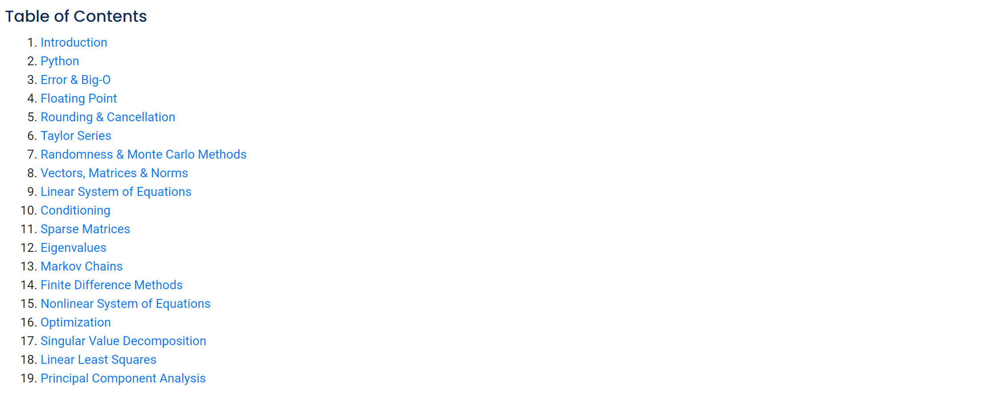

In [ ]:
# 4.1 Floating point
print(2**-5)

0.03125


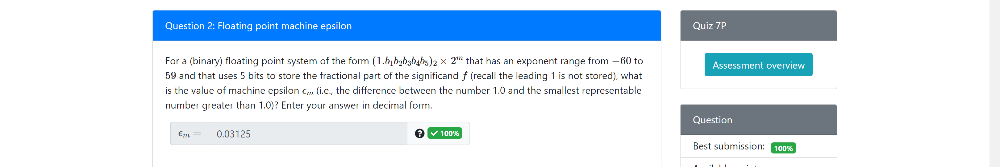

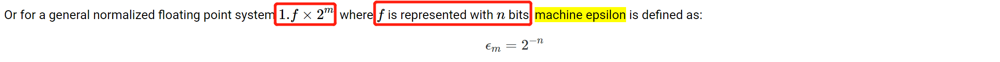

In [ ]:
# 4.2 floating point
print(2**-9)
print(2**11*(1-2**-5))
print(2**128*(1-2**-8))
print(13/4)

0.001953125
1984.0
3.3895313892515355e+38
3.25


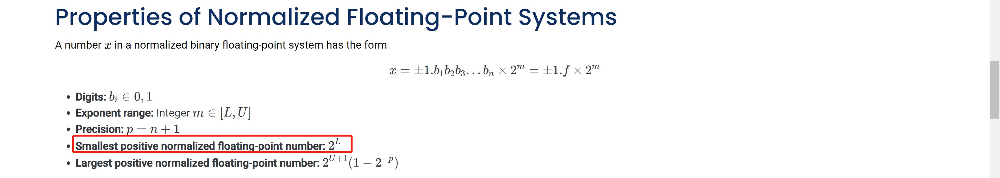

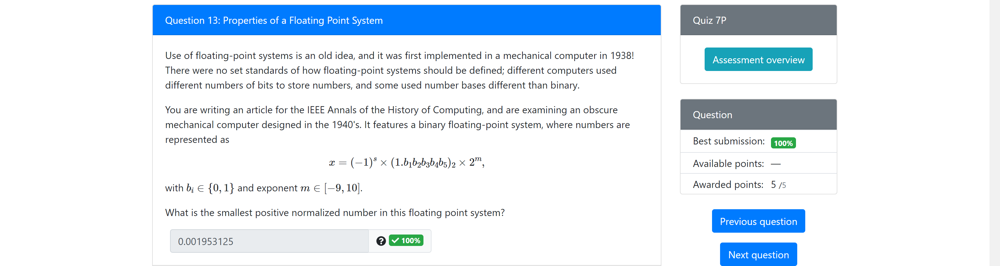

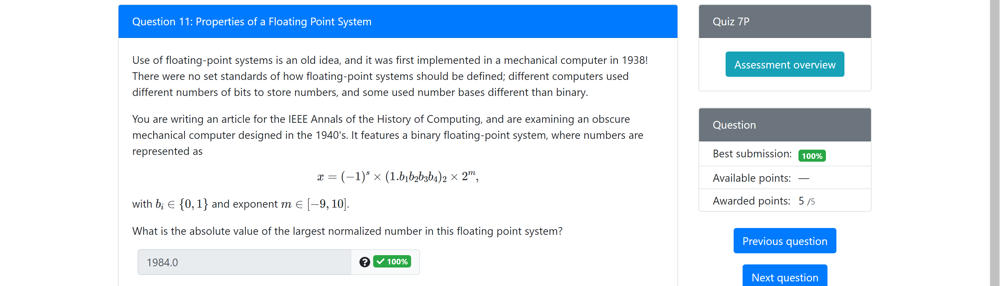

In [ ]:
# 4.3 Floating point 
# b5 -> k = 2**6 = 64
# bm -> k = 2**(k+1)

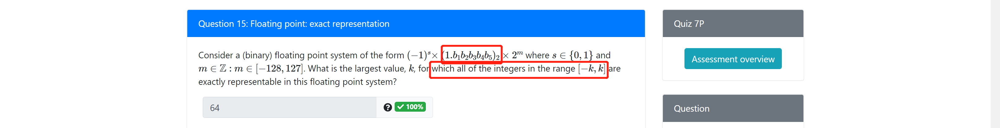

In [ ]:
# 5.1 Rounding
def DecimalToBinary(num, k_prec) :
    binary = "" 
    Integral = int(num) 
    fractional = num - Integral
    while (Integral) :
        rem = Integral % 2
        binary += str(rem); 
        Integral //= 2 
    binary = binary[ : : -1] 
    binary += '.'
    while (k_prec) :
        fractional *= 2
        fract_bit = int(fractional) 
        if (fract_bit == 1) :       
            fractional -= fract_bit 
            binary += '1'
        else :
            binary += '0'
        k_prec -= 1
    return binary 
    
print(DecimalToBinary(1.921875,10))

# 18.75 = 1.001011 * 2^4
# round up: 1.0011 * 2^4 == 19

1.1110110000


In [ ]:
# WATCH OUT!!! WHAT IS IT ASKING?!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# ROUND DOWN OR UP!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

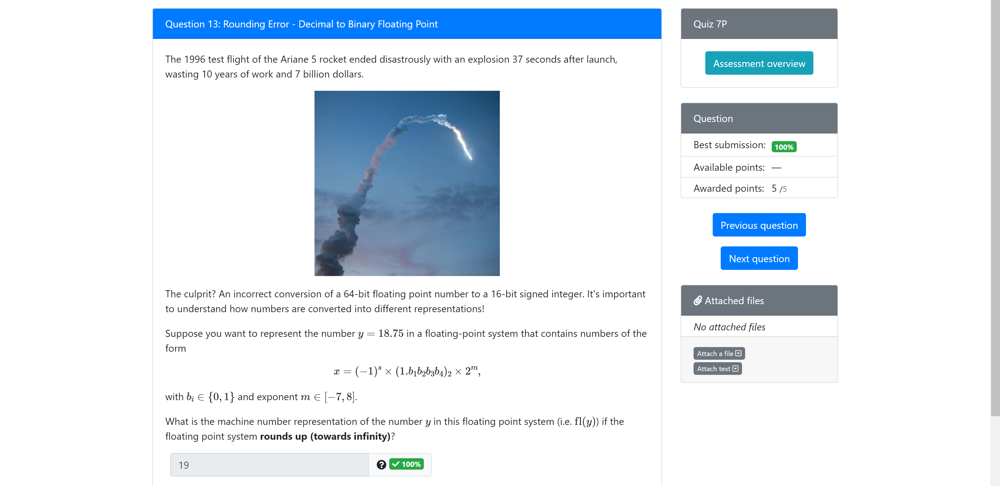

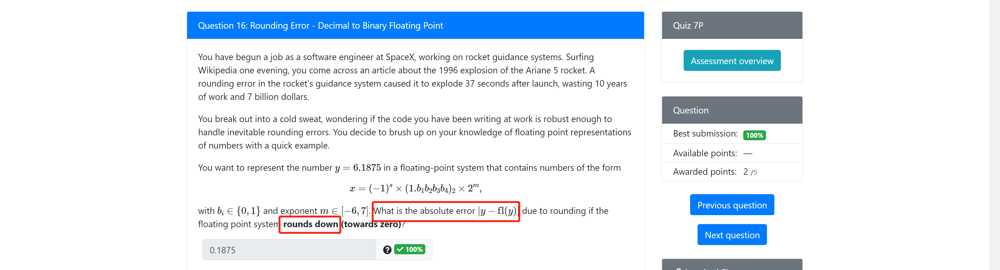

In [ ]:
# 6.1 Taylor Series


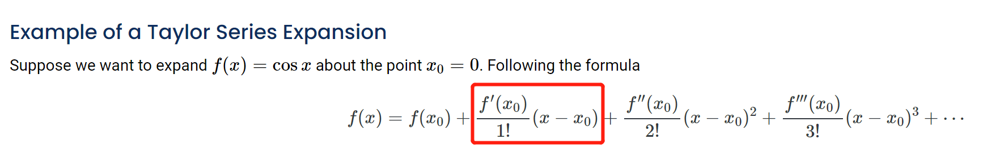

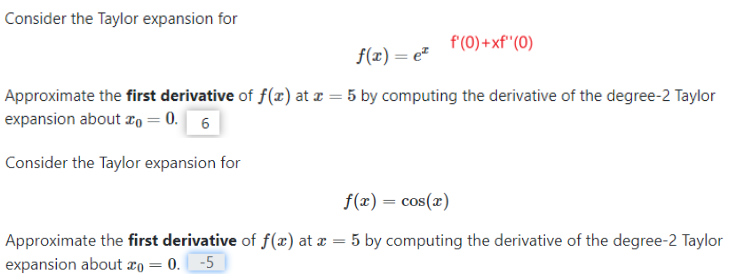

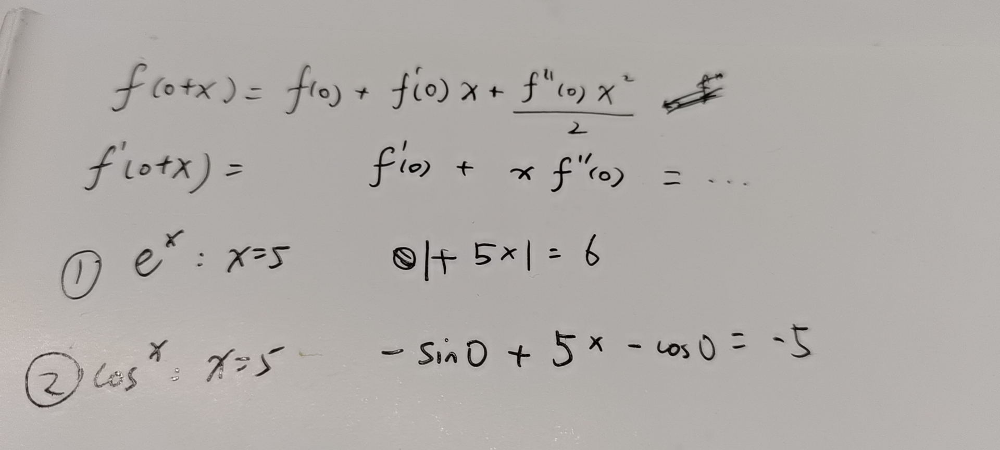

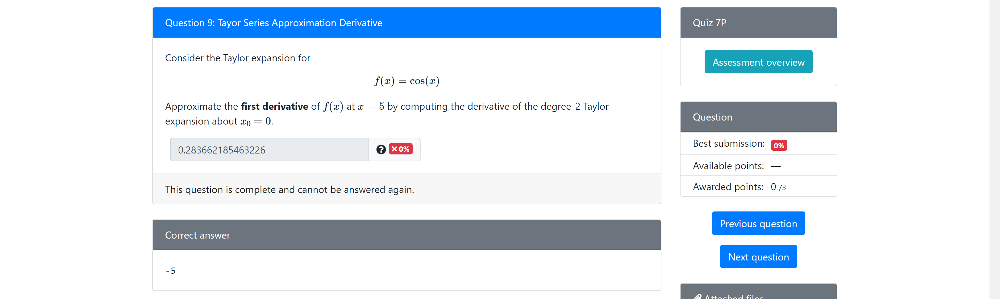

f(x) = f(0) + f'(0) * x + (f"(0) * x^2)/2

f'(x) = -sin(x) , f"(x) = -cos(x)

f'(x) = f'(0) + f"(0) * x = -sin(0) + -cos(0) * x = -x

f'(5) = -5


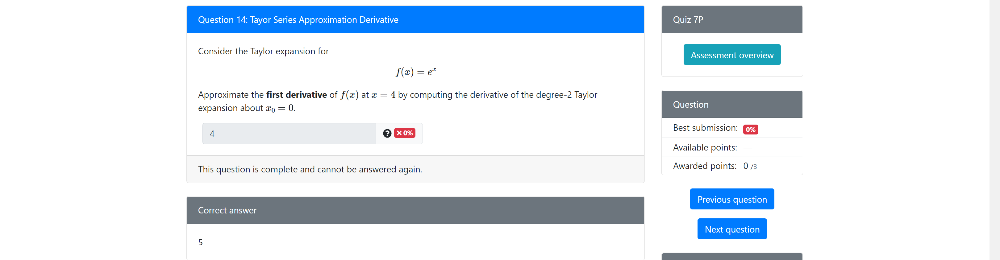

f(x) = f(0) + f'(0) * x + (f"(0) * x^2)/2

f'(x) = exp(x) , f"(x) = exp(x)

f'(x) =  f'(0) + f"(0) * x = exp(0) + exp(0) * x = 1 + x

f'(4) = 5

In [ ]:
# 6.2 Taylor expansion
# https://www.emathhelp.net/calculators/calculus-1/taylor-and-maclaurin-series-calculator/?f=sqrt+%28x%2B1%29&p=0&n=6&v=0.05&steps=on
# P Value!!!

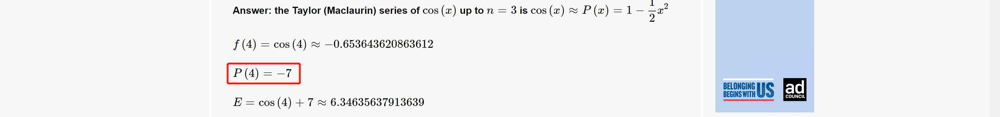

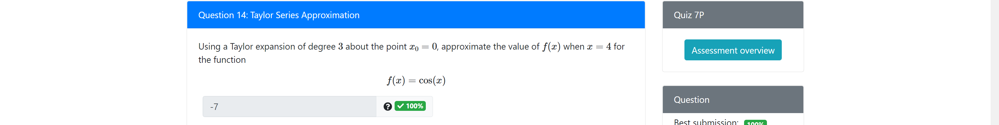

In [ ]:
# 6.3 Tayor Series Approximation Derivative
# https://www.emathhelp.net/calculators/calculus-1/taylor-and-maclaurin-series-calculator/?f=15x%5E2%2B14x%2B6&p=0&n=3&v=5

# f'(x) = 15*x**2+14*x+6

x = 5
print(15*x**2+14*x+6)

451


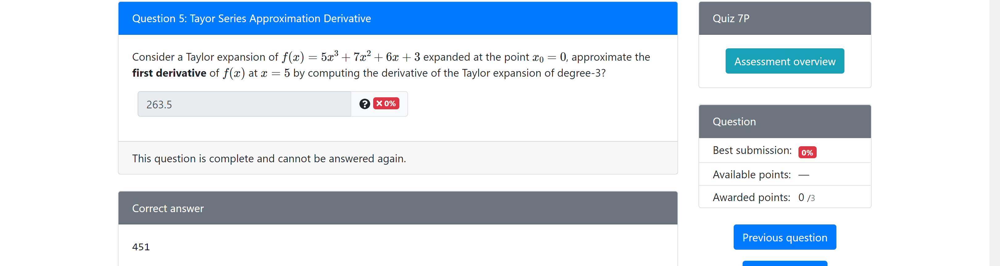

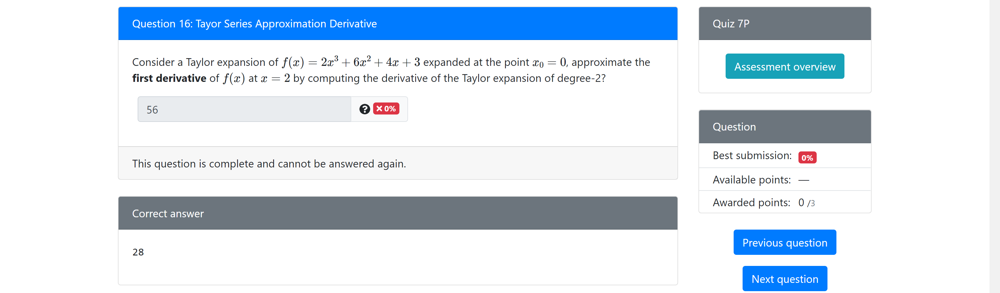

In [ ]:
# 8.1 Matrices

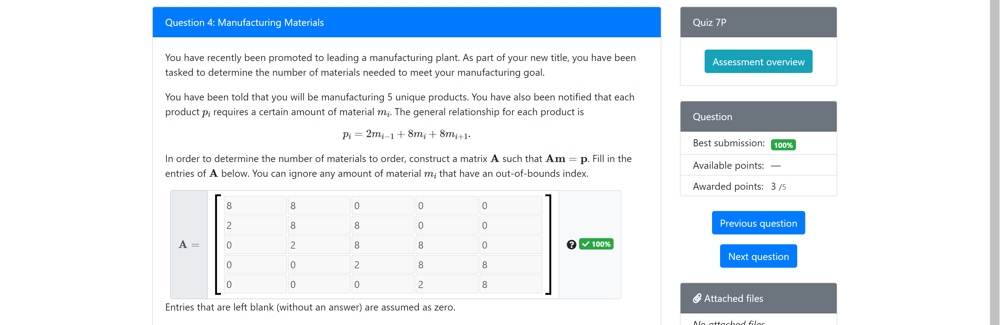

In [ ]:
# B^-1 = A-8I
# 4 = A - 8
# A = 12

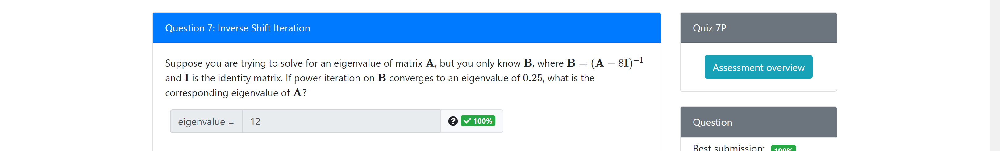

In [ ]:
# 8.2 Norm
import numpy as np
import numpy.linalg as la
A = np.array([[8,-7],[0,1]])
eigen_val, eigen_vec = la.eig(A)
X = np.zeros_like(eigen_vec)
# FOCUS ON THE NORM ORDER 记得改！！！！！！！！！！！！！！！！！！！！！！ norm order
X[:,0] = eigen_vec[:,0]/la.norm(eigen_vec[:,0],np.inf)
X[:,1] = eigen_vec[:,1]/la.norm(eigen_vec[:,1],np.inf)
print("X: ",X,"\n")
print("B: ",np.diag(eigen_val))

X:  [[1. 1.]
 [0. 1.]] 

B:  [[8. 0.]
 [0. 1.]]


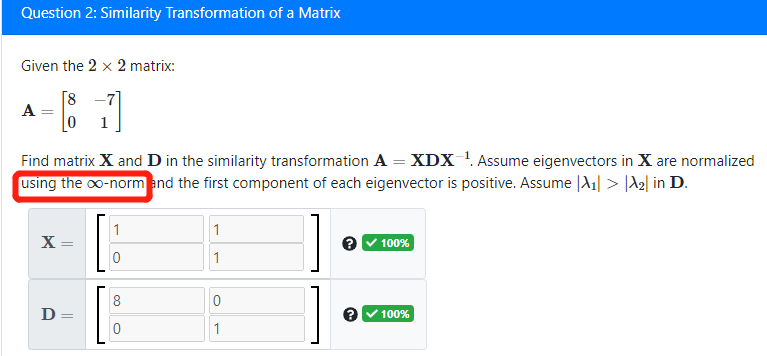

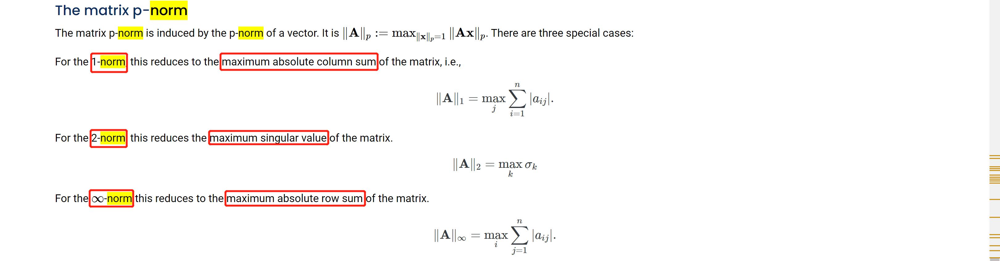

In [ ]:
# 10.1 Condition number

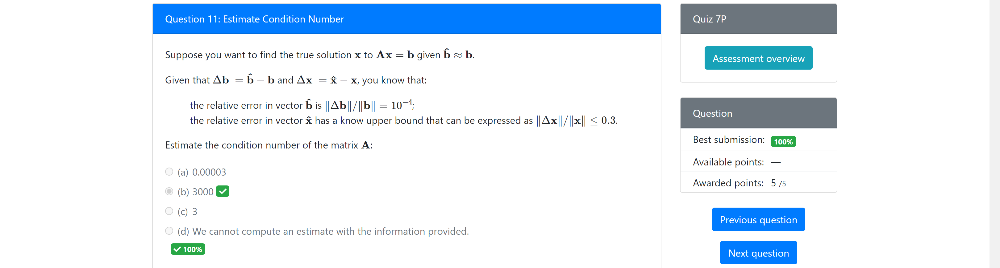

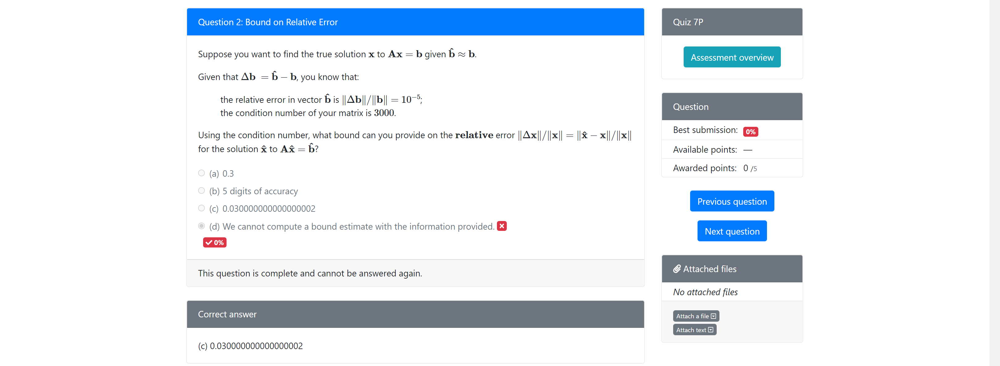

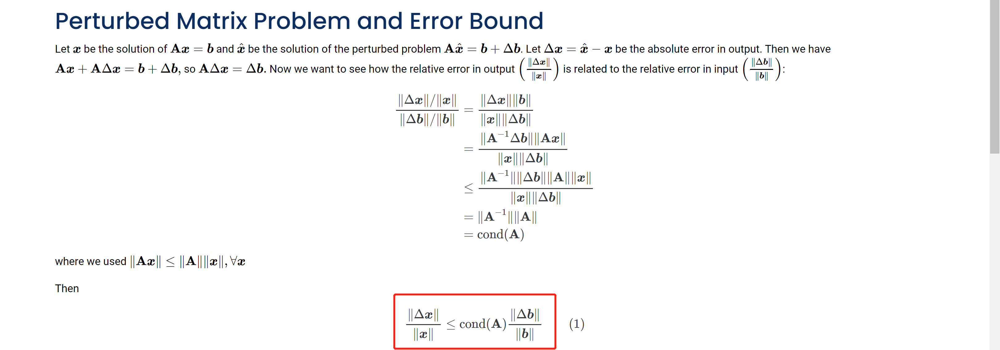

In [ ]:
# 10.2 condition number
# Question 4: Approximate Matrix Condition Number
x1,x2,x3=1,4,6
a1,a2,a3=10,20,120
# print(x1/a1,x2/a2,x3/a3)
# print(a1/x1,a2/x2,a3/x3)
print(max(x1/a1,x2/a2,x3/a3)*max(a1/x1,a2/x2,a3/x3))

0.1 0.2 0.05
10.0 5.0 20.0
4.0


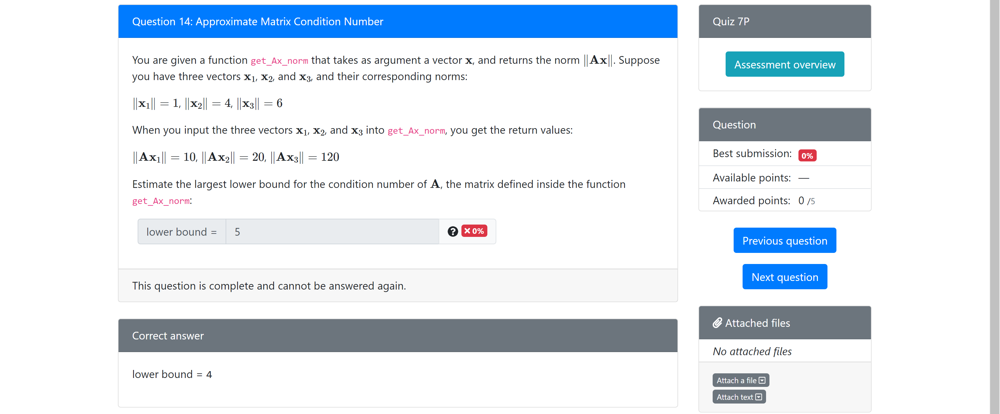

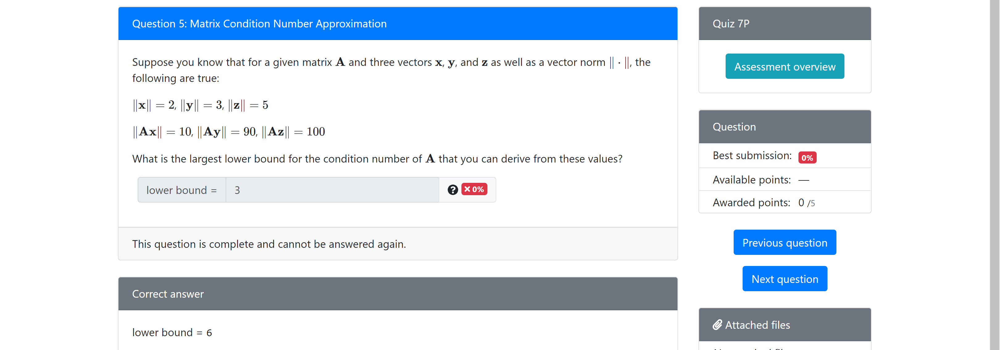

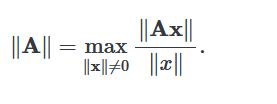

In [ ]:
# 11.1 Sparse Matrix

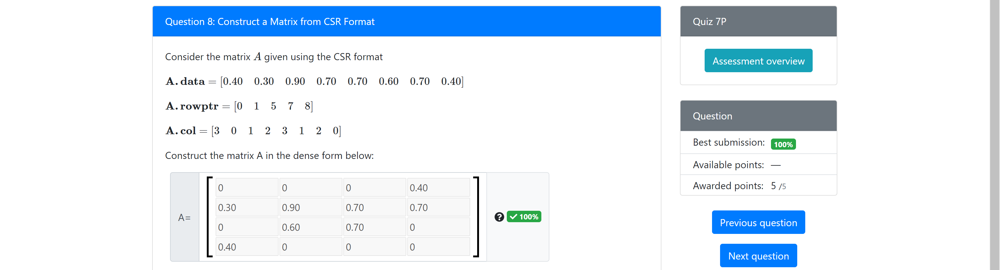

In [ ]:
# nnz: number of non-zero entries

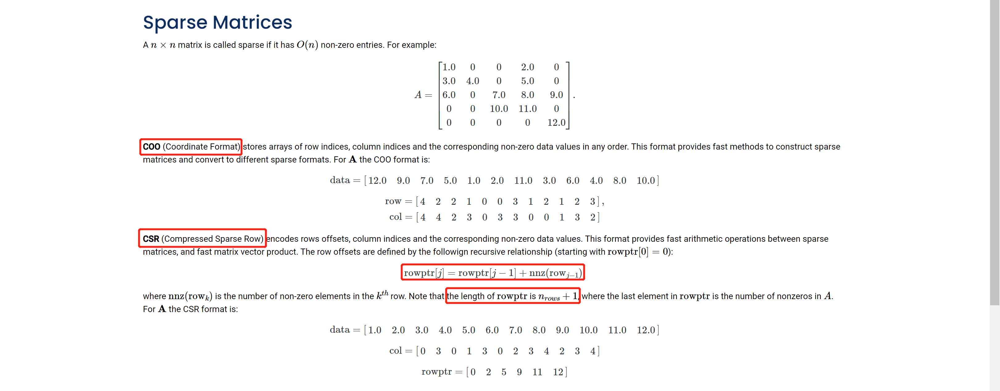

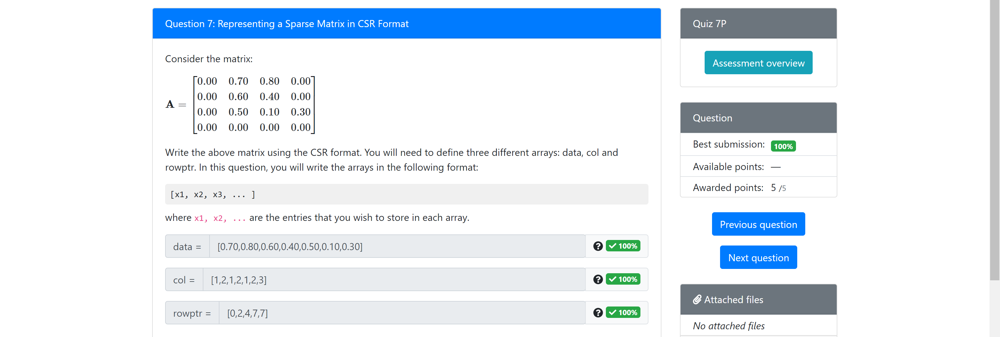

In [ ]:
# 12.1 eigenvalues
# T11–HW11.12. Result of Normalized Power, Inverse, and Shifted Inverse Iteration
import numpy as np
import numpy.linalg as la
import scipy.linalg as sla

# change norm level!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
X= np.array([[2,5,17], [5,12,15], [3,19,1]])
D= np.diag([3,7,5])
norm_level = 1 # np.inf # input 1

A = X @ D @ la.inv(X)
x0 = np.random.randn(3)
x = x0
x = x0/ la.norm(x0)
print("(Power)")
for i in range(220):
    x = A @ x
    x = x / la.norm(x,norm_level)
    if i > 210:
        print(x)

sigma = 0 # always 0, do not change
x = x0
x = x0/ la.norm(x0)
B = A
P, L, Um = sla.lu(B)
print("(Inverse)")
for k in range(200):
    y = sla.solve_triangular(L, np.dot(P.T, x), lower=True)
    x = sla.solve_triangular(Um, y)
    x = x/la.norm(x,norm_level) # np.inf
    if k > 190:
        print(x)
print("lambdan = ",x.T@A@x/(x.T@x))
print("un = ", x)
x = x0
x = x0/ la.norm(x0)
sigma = -7.7 # neg, input 2
B = A + sigma*np.eye(A.shape[0])
P, L, Um = sla.lu(B)
print("(Shifted Inverse)")
for k in range(200):
    y = sla.solve_triangular(L, np.dot(P.T, x), lower=True)
    x = sla.solve_triangular(Um, y)
    x = x/la.norm(x,norm_level)
    if k > 190:
        print(x)
print("lambdan = ",x.T@A@x/(x.T@x))
print("un = ", x)  
# The final result is positive [2 input in total]

(Power)
[0.13888889 0.33333333 0.52777778]
[0.13888889 0.33333333 0.52777778]
[0.13888889 0.33333333 0.52777778]
[0.13888889 0.33333333 0.52777778]
[0.13888889 0.33333333 0.52777778]
[0.13888889 0.33333333 0.52777778]
[0.13888889 0.33333333 0.52777778]
[0.13888889 0.33333333 0.52777778]
[0.13888889 0.33333333 0.52777778]
(Inverse)
[-0.2 -0.5 -0.3]
[-0.2 -0.5 -0.3]
[-0.2 -0.5 -0.3]
[-0.2 -0.5 -0.3]
[-0.2 -0.5 -0.3]
[-0.2 -0.5 -0.3]
[-0.2 -0.5 -0.3]
[-0.2 -0.5 -0.3]
[-0.2 -0.5 -0.3]
lambdan =  3.0000000000000018
un =  [-0.2 -0.5 -0.3]
(Shifted Inverse)
[0.13888889 0.33333333 0.52777778]
[-0.13888889 -0.33333333 -0.52777778]
[0.13888889 0.33333333 0.52777778]
[-0.13888889 -0.33333333 -0.52777778]
[0.13888889 0.33333333 0.52777778]
[-0.13888889 -0.33333333 -0.52777778]
[0.13888889 0.33333333 0.52777778]
[-0.13888889 -0.33333333 -0.52777778]
[0.13888889 0.33333333 0.52777778]
lambdan =  6.999999999999998
un =  [0.13888889 0.33333333 0.52777778]


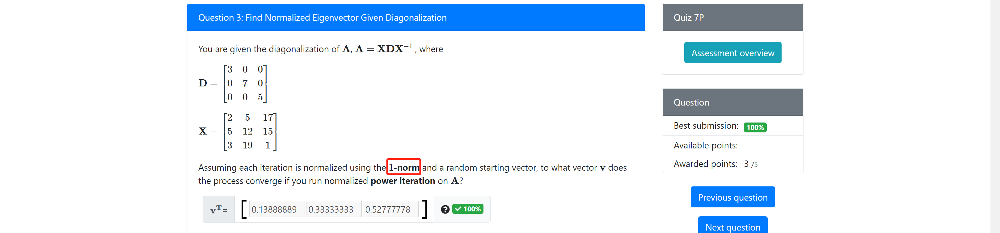

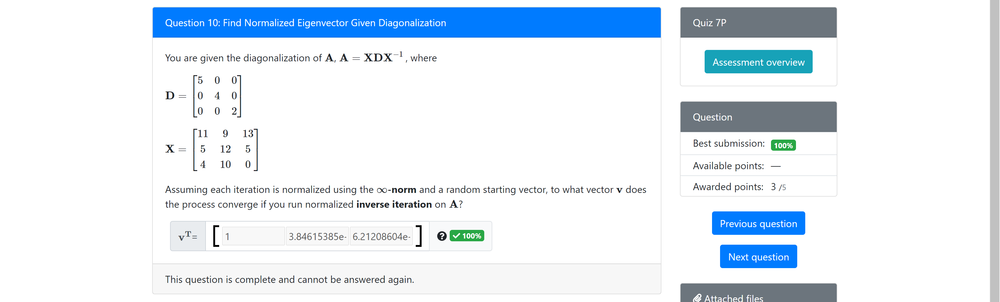

In [ ]:
# 12.1 eigenvalue calculation
# CALCULATE BACK AND FORTH!!!
a = -1
print(a**3-5*a**2-9*a+6)

9


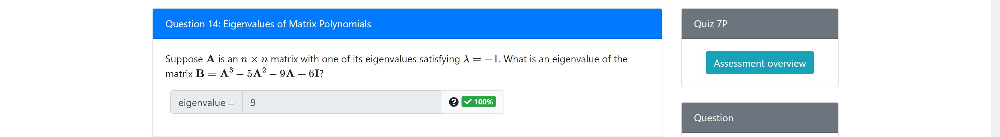

In [ ]:
# 12.2 eigenvalue
# answer: -5

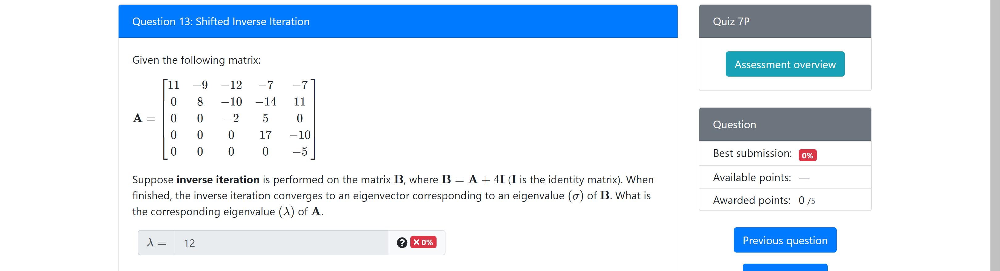

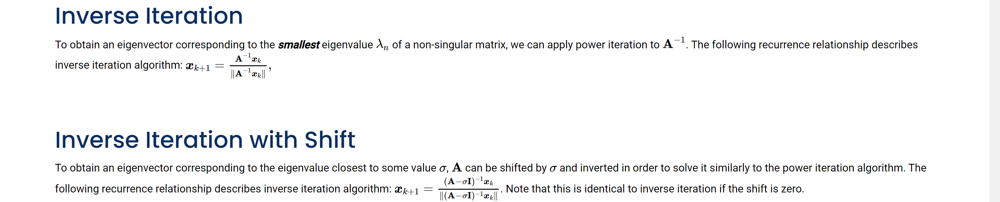

In [ ]:
# 14.1 Nonlinear equations


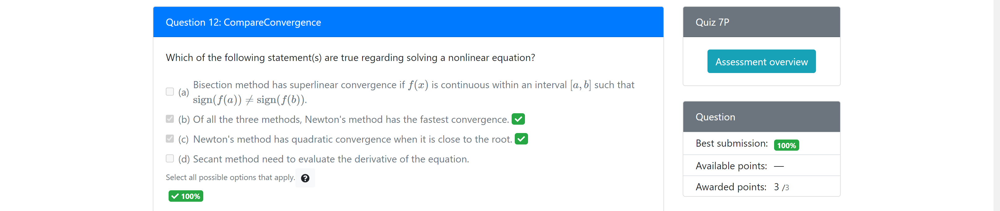

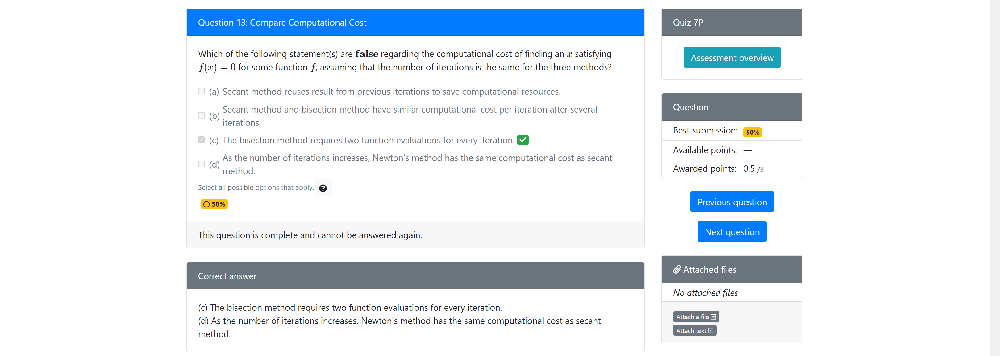

In [ ]:
# both secant and bisection reuse previous result
# O(n^2) - Jacobian
# O(n^3) - Hessian

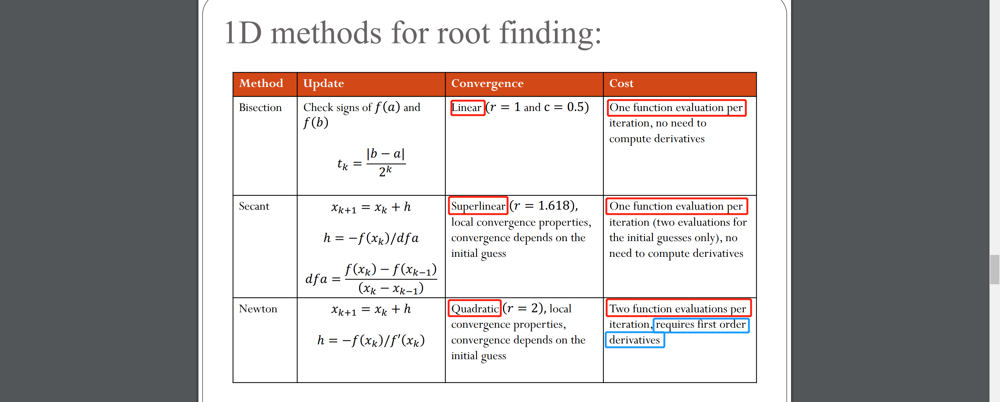

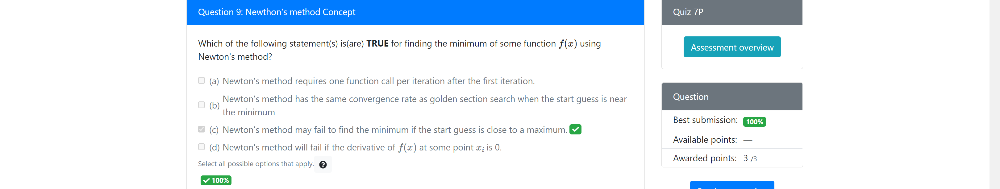

In [ ]:
# 14.2 Jacobian matrix
# Question 14: NewtonND-triangular
import sympy as sym
import numpy as np
import numpy.linalg as la

def Jacobian(v_str, f_list):
    vars = sym.symbols(v_str)
    f = sym.sympify(f_list)
    J = sym.zeros(len(f),len(vars))
    for i, fi in enumerate(f):
        for j, s in enumerate(vars):
            J[i,j] = sym.diff(fi, s)
    return J

print("J: ",Jacobian('x y', ['4*x**2+3*y**4-6','2*x**3+6*y-5']))

# DO NOT NEED CALCULATION!!! JUST COPY AND PASTE


J:  Matrix([[8*x, 12*y**3], [6*x**2, 6]])


In [ ]:
# 14.2 continue
# All NEEDS TO CHANGE:
x0 = np.array([-1,0])
x ,y = x0
A = np.array([[8*x, 12*y**3], [6*x**2, 6]])
f = np.array([4*x**2+3*y**4-6,2*x**3+6*y-5])
s = la.solve(A,-f)
print("A:",A)
print("s: ",s)
x1 = x0 + s

print("x1:",x1)

A: [[-8  0]
 [ 6  6]]
s:  [-0.25        1.41666667]
x1: [-1.25        1.41666667]


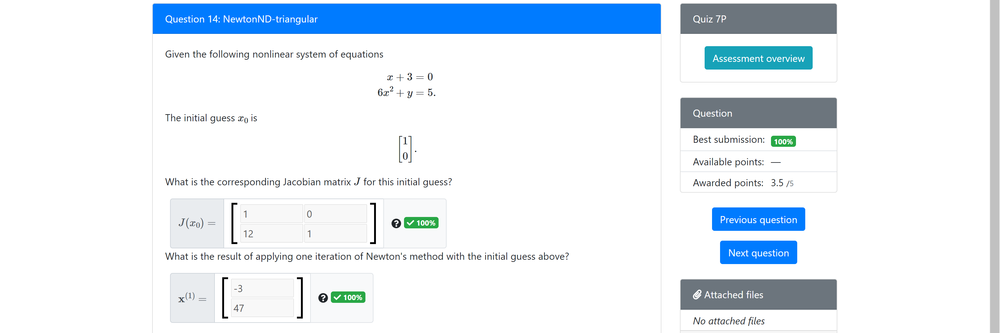

In [ ]:
# 14.3 Bisection error
# 记得改tolerance！！！
e = 0.2435
tol = 10**-3

count = 0
while True:
  e = e/2
  count += 1
  if e < tol:
    break
print(count)

8


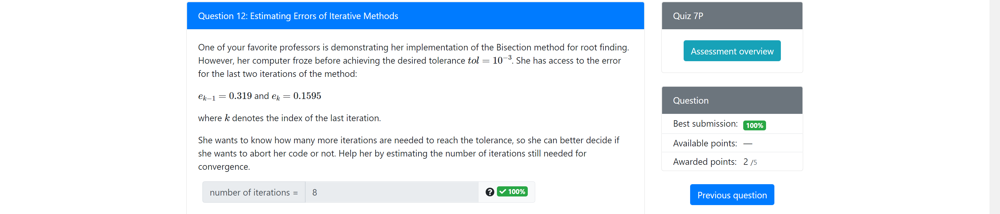

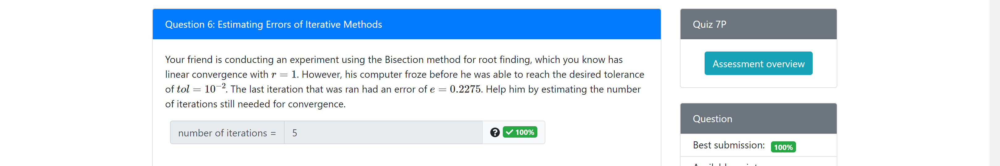

In [ ]:
# 14.4 secant method
import numpy as np
r = 1.618
ek1 = 0.271
ek = 0.084653
C = (ek)/((ek1)**r)
print(ek**r*C)

0.01288318873304374


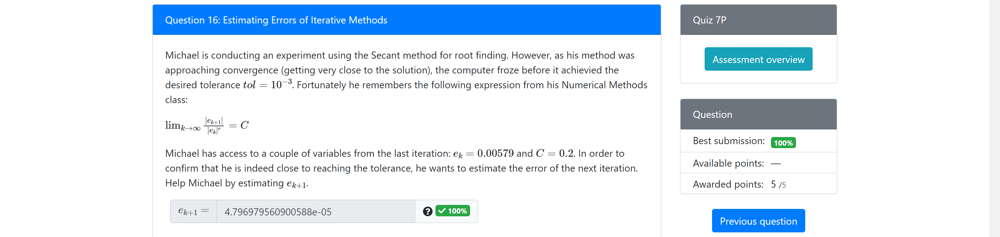

In [ ]:
# 14.5 Newton solve 2
import sympy as sym
import numpy as np
import numpy.linalg as la

def Jacobian(v_str, f_list):
    vars = sym.symbols(v_str)
    f = sym.sympify(f_list)
    J = sym.zeros(len(f),len(vars))
    for i, fi in enumerate(f):
        for j, s in enumerate(vars):
            J[i,j] = sym.diff(fi, s)
    return J

print("J: ",Jacobian('x y', ['4*x*y','x**3+y**2+1']))

# DO NOT NEED CALCULATION!!! JUST COPY AND PASTE

J:  Matrix([[4*y, 4*x], [3*x**2, 2*y]])


In [ ]:
# 14.2 continue
# All NEEDS TO CHANGE:
# 記得改x0！！！！！！！！！！！！！！！！！！！！！！！！！！！！！！！！
x0 = np.array([1,0])
x ,y = x0
A = np.array([[4*y, 4*x], [3*x**2, 2*y]])
f = np.array([4*x*y,x**3+y**2+1])
s = la.solve(A,-f)
print("A:",A)
print("s: ",s)
x1 = x0 + s

print("x1:",x1)

A: [[0 4]
 [3 0]]
s:  [-0.66666667  0.        ]
x1: [0.33333333 0.        ]


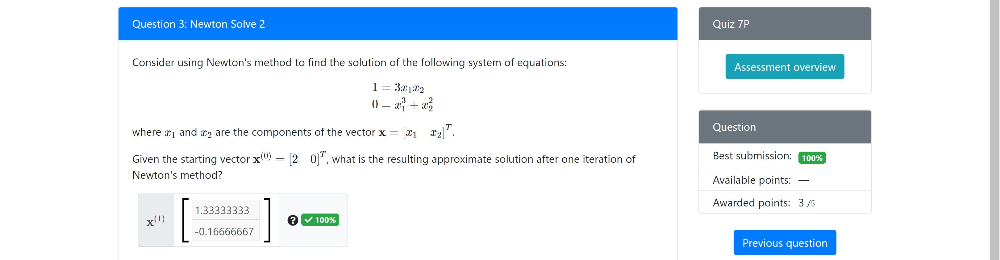

In [ ]:
# 15 Finite Differences
import numpy as np
print((0.66**2-0.54**2)/0.12)

1.2000000000000002


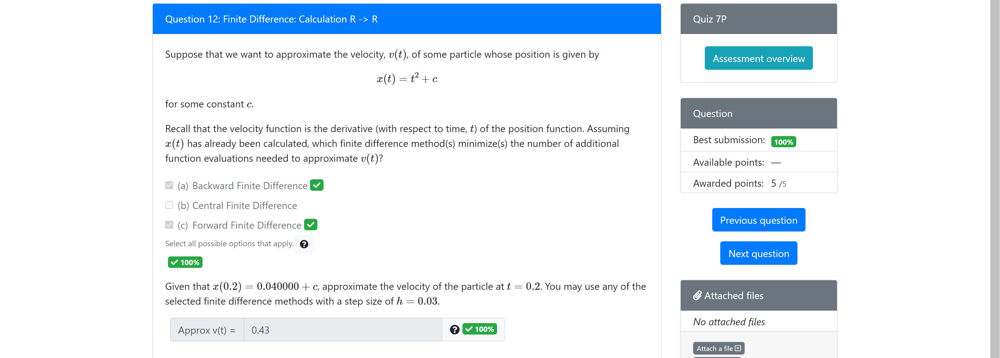

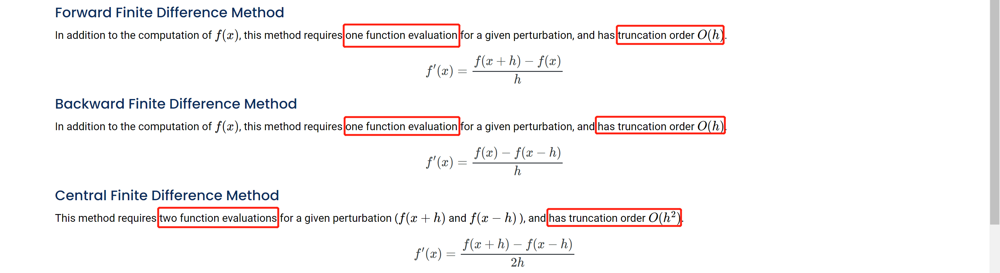

In [ ]:
# 15.2 Finite Difference Gradient
import numpy as np

def f(x0):
    x,y,z = x0
    return x**2*y*z+2*x*z

h=0.1
x=np.array([1,1,1])


a=np.zeros(len(x))
b=np.zeros(len(x))
for i in range(len(x)):
    a[i] = h
    b[i] = (f(x)-f(x-a))/h
    a[i] = 0
approx_gradient = b
print(b)

[3.9 1.  3. ]


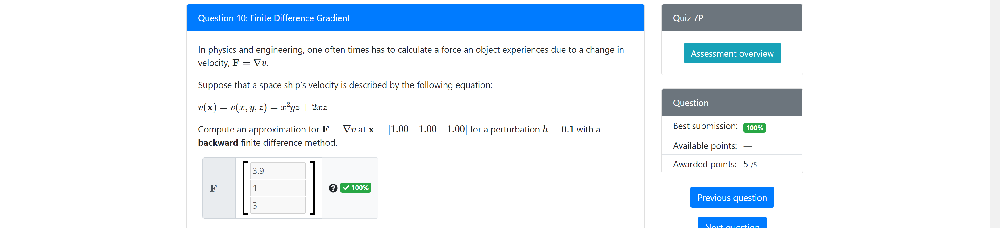

In [ ]:
# 16.1 Optimization
# https://www.wolframalpha.com/input/?i=Hessian+matrix+6x%5E4+%2B+3y%5E2
# 注意是加还是减！！！!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
import numpy as np
H = np.array([[72,0],[0,6]])
x = np.array([1,3])
# f is derivative
f = np.array([24*x[0]**3,6*x[1]**1])
s = np.linalg.solve(H, -f)
print("s: ",s)
x1=x+s
print("x1: ",x1)
# print(36*9)

s:  [-0.33333333 -3.        ]
x1:  [0.66666667 0.        ]


In [ ]:
print()

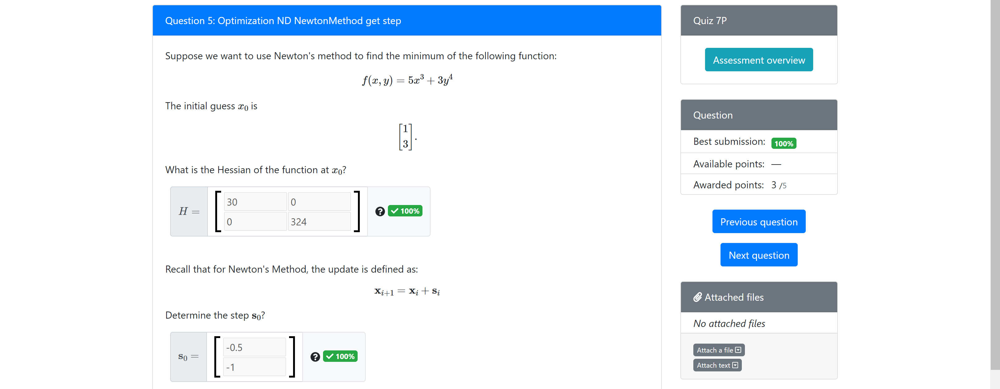

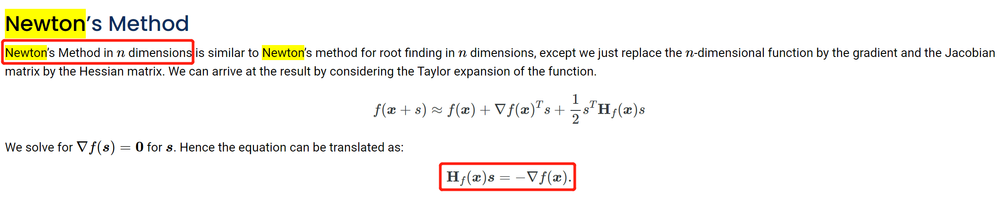

In [ ]:
# 16.2 Optimization

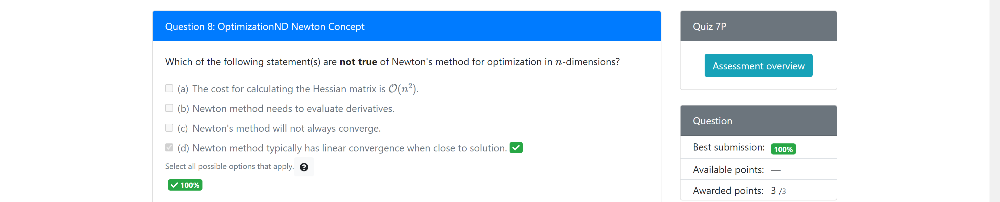

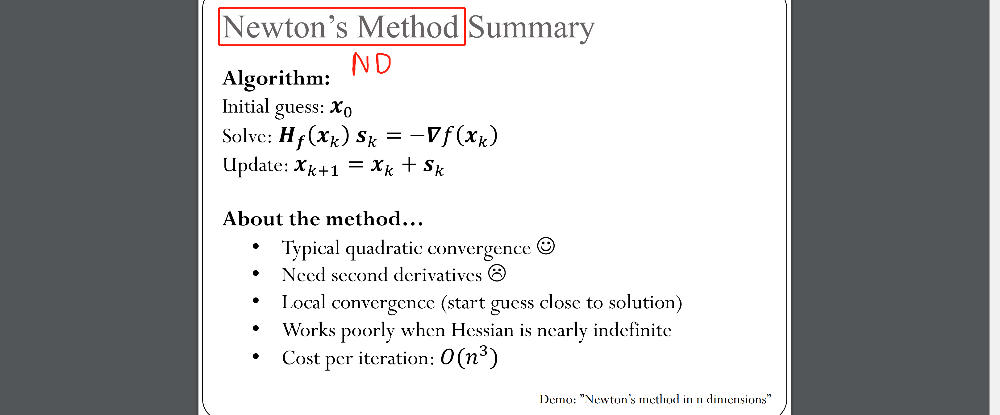

In [ ]:
# 16.3 Steepest descent
# https://www.symbolab.com/solver/partial-derivative-calculator/%5Cfrac%7B%5Cpartial%7D%7B%5Cpartial%20x%7D%5Cleft(8x%5E%7B2%7D%2B12xy%2B8y%5E%7B2%7D%2B14sin%5E%7B2%7D%5Cleft(y%5Cright)%2B4cos%5Cleft(xy%5Cright)%5Cright)
import numpy.linalg as la
import scipy.optimize as opt
import numpy as np

def obj_func(alpha, x, s):
    # code for computing the objective function at (x+alpha*s)
    return f_of_x_plus_alpha_s

def gradient(x0):
    # code for computing gradient
    x, y = x0
    grad_x = np.array([16*x+12*y-4*y*np.sin(x*y),12*x+16*y+28*np.sin(y)*np.cos(y)-4*x*np.sin(x*y)])
    return grad_x

x0 = np.array([-2,4])
alpha = 0.02

s = -gradient(x0)
x1 = x0 + alpha*s
print("s: ",s)
print("x1: ",x1)



s:  [-31.82973195 -45.93614948]
x1:  [-2.63659464  3.08127701]


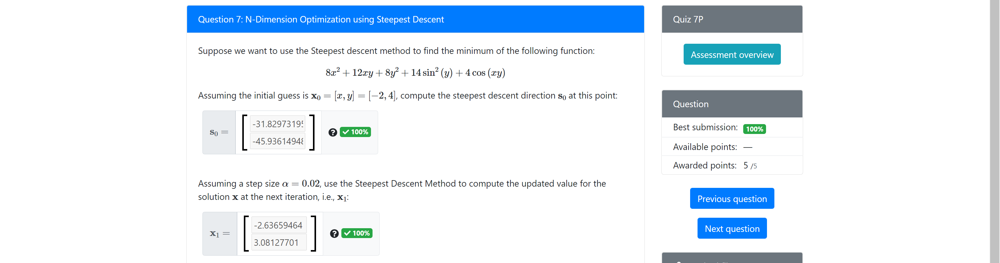

In [ ]:
# 17.1 SVD Question 15: Getting the rank of matrix A from data points
# min(m,n)
# DOUBLE CHECK!!!

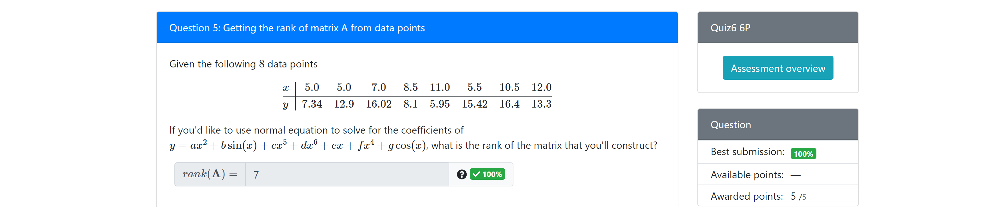

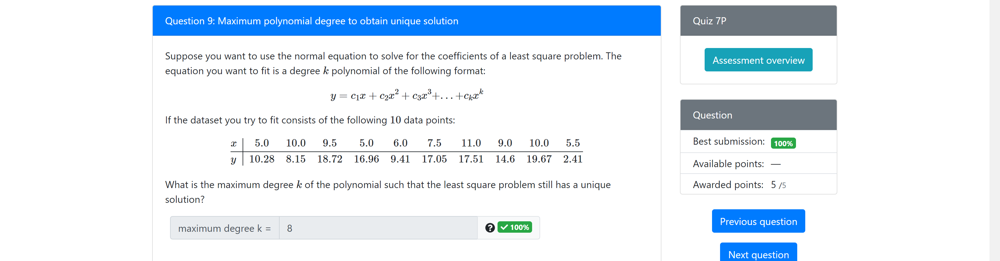

In [ ]:
# 17.2 rank

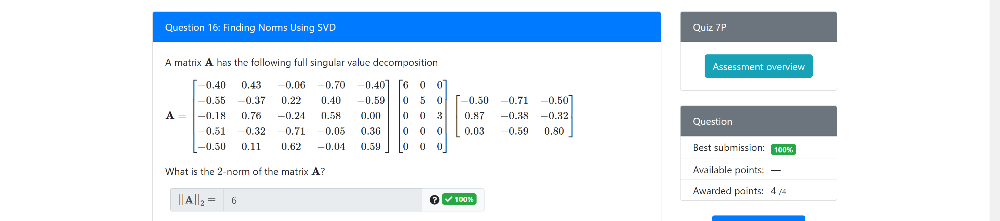

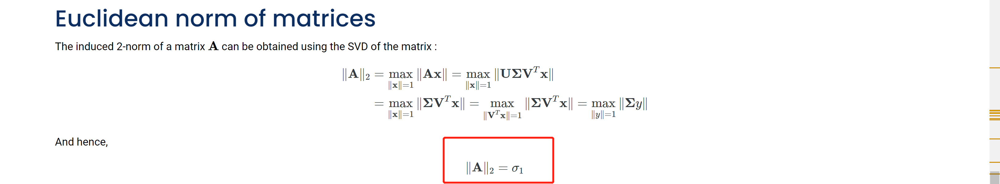

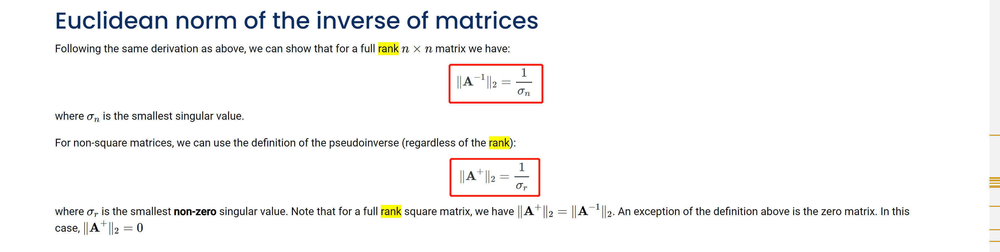

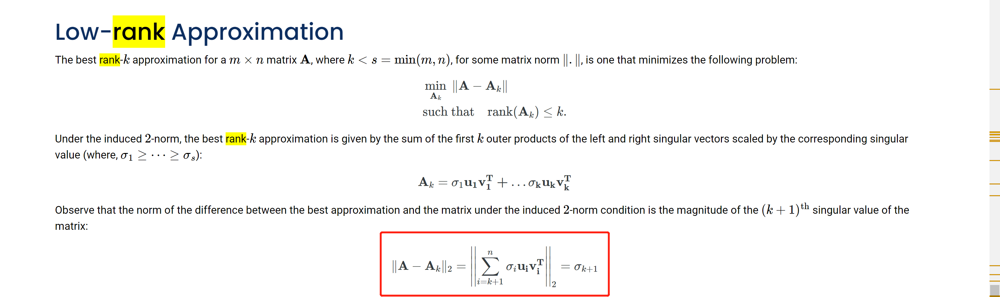

In [ ]:
# 17.3 SVD rank-1 approx

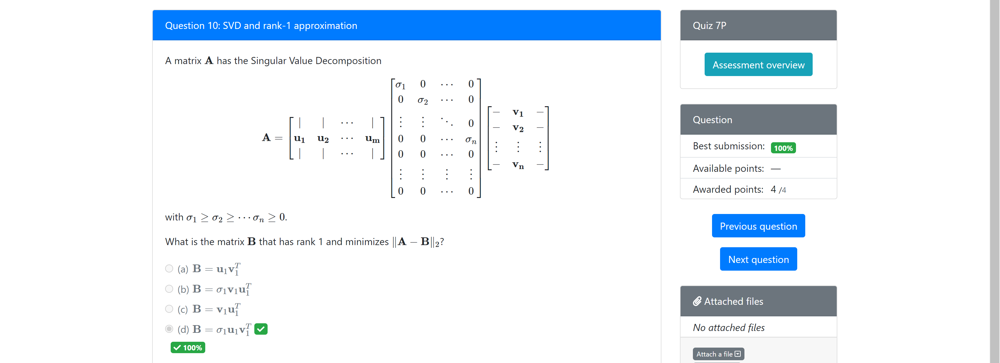

In [ ]:
# 17.4 Rsidual
import numpy as np
print(np.sqrt(9**2+3**2))

9.486832980505138


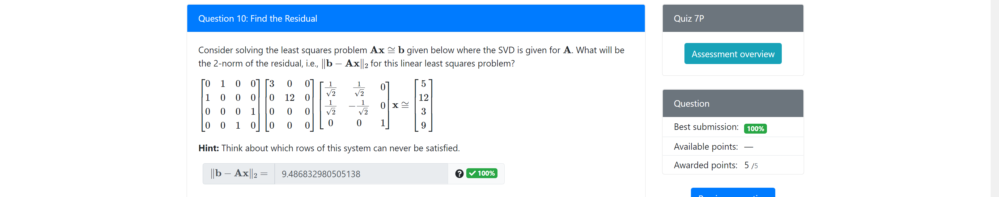

In [ ]:
# 19.1 PCA Singular Values for PCA Mean
import numpy as np

X = np.array([[-0.655, -0.793, -0.554], [-2.001, -1.516, -0.514], [-2.054, -1.002, 0.843], [-0.340, -1.037, -1.084]])
X0 = X-np.mean(X,axis=0)
print("0 mean: \n",X0)
U,S,Vt = np.linalg.svd(X0)
print("\nS: ",S)

0 mean: 
 [[ 0.6075   0.294   -0.22675]
 [-0.7385  -0.429   -0.18675]
 [-0.7915   0.085    1.17025]
 [ 0.9225   0.05    -0.75675]]

S:  [1.96734878 0.90503715 0.10493937]


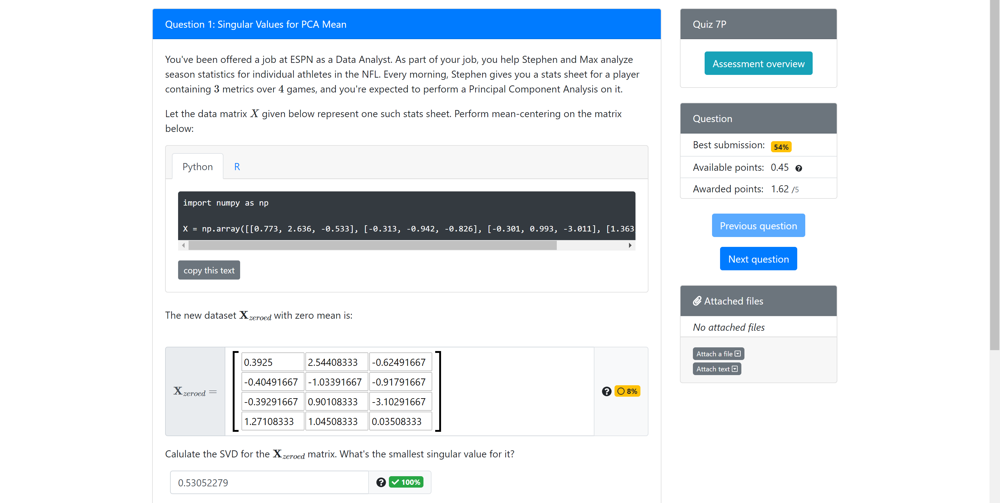

In [ ]:
# 19.2 PCA PCA Number of Components
import numpy as np

U = np.array([[-0.1, -0.4, -0.1, 0.3, -0.5, -0.2, 0.5, 0.0, 0.1], [0.1, -0.1, 0.5, 0.0, -0.2, 0.0, 0.1, 0.4, -0.4], [0.0, -0.2, 0.1, 0.3, 0.0, 0.5, -0.1, -0.5, -0.1], [0.2, 0.0, 0.4, -0.2, -0.1, 0.0, 0.3, -0.6, 0.1], [0.4, -0.1, 0.2, 0.3, 0.0, -0.4, -0.4, -0.1, 0.4], [0.5, -0.4, 0.0, 0.2, 0.4, 0.0, 0.1, 0.2, -0.1], [-0.1, 0.1, 0.1, 0.2, -0.3, -0.4, -0.1, -0.1, -0.2], [0.2, 0.6, -0.2, 0.2, 0.1, -0.1, 0.2, -0.2, -0.1], [-0.3, -0.2, -0.3, 0.0, 0.1, -0.3, 0.1, -0.3, -0.2], [-0.1, 0.2, -0.1, 0.5, -0.2, 0.1, -0.3, 0.1, -0.2], [0.2, 0.1, -0.3, 0.3, 0.2, 0.1, 0.4, 0.1, -0.1], [0.0, 0.1, -0.2, 0.1, -0.1, 0.0, -0.1, 0.1, 0.2], [0.2, 0.1, -0.1, 0.0, -0.4, 0.0, -0.2, 0.0, -0.2], [-0.3, 0.1, 0.2, 0.3, 0.3, -0.3, 0.2, 0.2, 0.3], [-0.3, 0.2, 0.4, 0.3, 0.1, 0.3, 0.2, -0.1, 0.1], [0.3, 0.1, -0.1, -0.1, -0.3, 0.0, 0.2, 0.1, 0.5], [0.2, 0.1, 0.2, -0.1, 0.2, -0.3, 0.2, -0.1, -0.4]])
S = np.array([[36,  0,  0,  0,  0,  0,  0,  0,  0], [ 0, 35,  0,  0,  0,  0,  0,  0,  0], [ 0,  0, 28,  0,  0,  0,  0,  0,  0], [ 0,  0,  0, 18,  0,  0,  0,  0,  0], [ 0,  0,  0,  0, 13,  0,  0,  0,  0], [ 0,  0,  0,  0,  0, 11,  0,  0,  0], [ 0,  0,  0,  0,  0,  0, 10,  0,  0], [ 0,  0,  0,  0,  0,  0,  0,  3,  0], [ 0,  0,  0,  0,  0,  0,  0,  0,  2]])
V = np.array([[-0.2, 0.4, -0.2, 0.5, -0.3, 0.0, 0.4, 0.5, 0.0], [-0.2, -0.3, -0.5, 0.3, 0.0, 0.1, -0.4, 0.0, -0.6], [0.3, 0.0, -0.2, 0.4, 0.1, 0.5, 0.4, -0.5, 0.1], [0.0, -0.3, -0.6, -0.2, -0.1, -0.5, 0.4, -0.2, 0.2], [0.6, -0.1, -0.2, 0.2, -0.3, 0.0, -0.5, 0.2, 0.4], [0.1, 0.4, 0.1, 0.1, -0.6, -0.3, -0.1, -0.5, -0.3], [-0.4, 0.5, -0.4, -0.3, 0.0, 0.3, -0.3, -0.2, 0.4], [0.2, -0.1, -0.1, -0.6, -0.5, 0.4, 0.2, 0.2, -0.3], [-0.5, -0.5, 0.3, 0.2, -0.5, 0.2, 0.0, -0.1, 0.3]])
limit = 0.84

S = S**2
sum = 0
for i in range(len(S)):
  sum += S[i,i]
S = S/sum
list=[]
add = 0
for i in range(len(S)):
  add += S[i,i]
  list.append(add)
  if limit <= add:
    print(i+1)
    break
# print(list)

4


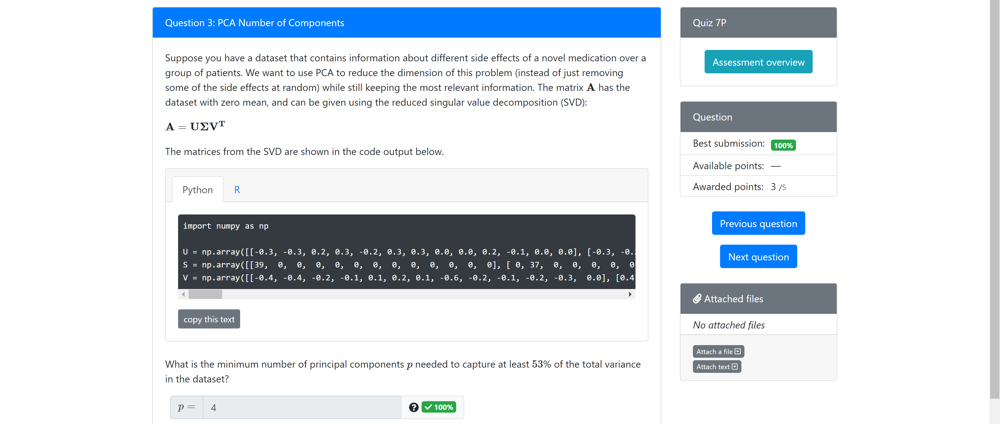